## Hierarchical Clustering

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi']=(250)  
sns.set_style('darkgrid')

In [15]:
df = pd.read_csv("EastWestAirlines.csv")

In [16]:
df

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [32]:
df.describe()

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [33]:
df.shape

(3999, 12)

In [34]:
df.isna().sum()

ID                   0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award                0
dtype: int64

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID                 3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award              3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [82]:
df.shape

(3999, 12)

In [36]:
df['Award'].unique()

array([0, 1], dtype=int64)

# data splitting

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [66]:
x =df.iloc[:,:-1]
y= df['Award']

In [67]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

In [68]:
lg = LogisticRegression()

lg.fit(xtrain,ytrain)
ypred = lg.predict(xtest)

In [69]:
ypred

array([1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,

# Feature Scaling

In [46]:
from sklearn.preprocessing import StandardScaler

In [47]:
sc = StandardScaler()
sc.fit_transform(x)

array([[-1.73512503e+00, -4.51140783e-01, -1.86298687e-01, ...,
        -3.28603258e-01, -3.62167870e-01,  1.39545434e+00],
       [-1.73426342e+00, -5.39456874e-01, -1.86298687e-01, ...,
        -3.28603258e-01, -3.62167870e-01,  1.37995704e+00],
       [-1.73340181e+00, -3.20031232e-01, -1.86298687e-01, ...,
        -3.28603258e-01, -3.62167870e-01,  1.41192021e+00],
       ...,
       [ 1.72682006e+00, -4.29480975e-05, -1.86298687e-01, ...,
        -3.28603258e-01, -3.62167870e-01, -1.31560393e+00],
       [ 1.72768167e+00, -1.85606976e-01, -1.86298687e-01, ...,
         2.85309024e-02, -9.85033311e-02, -1.31608822e+00],
       [ 1.72854328e+00, -7.00507951e-01, -1.86298687e-01, ...,
        -3.28603258e-01, -3.62167870e-01, -1.31754109e+00]])

In [50]:
from scipy.cluster import hierarchy

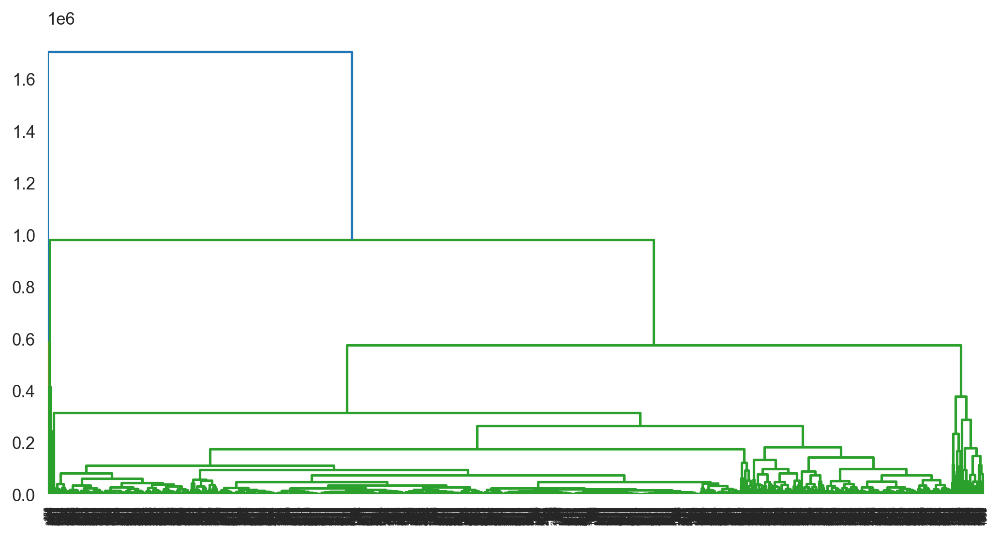

In [51]:
k = hierarchy.linkage(x,method='complete')
dendro = hierarchy.dendrogram(k)

In [53]:
df.groupby('Award').agg('mean')

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
Award,,,,,,,,,,,
0,2173.169182,59807.839555,87.602462,1.705322,1.01390,1.008737,10227.689039,9.142971,226.292295,0.652502,3820.652105
1,1745.592843,97053.051317,240.196489,2.661715,1.01553,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120


<AxesSubplot:xlabel='cc1_miles', ylabel='Bonus_miles'>

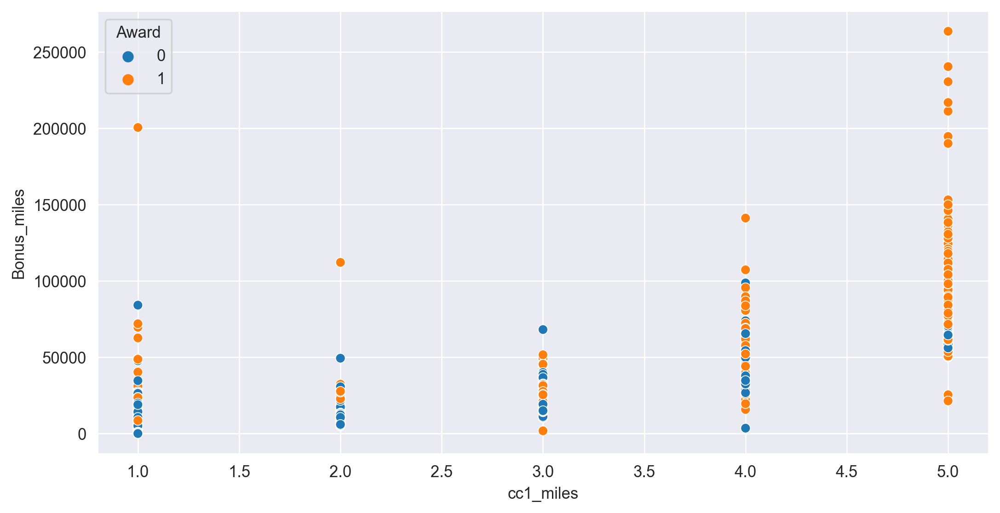

In [56]:
sns.scatterplot(df['cc1_miles'],df['Bonus_miles'],hue=df['Award'])

In [57]:
df[df['Award']==0]

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
5,6,16420,0,1,1,1,0,0,0,0,6942,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3991,4014,39142,0,3,1,1,14981,28,0,0,1408,0
3992,4015,11181,0,1,1,1,929,12,0,0,1407,0
3993,4016,3974,0,1,1,1,365,3,0,0,1397,0
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [20]:
data = pd.DataFrame(x)
data

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
0,1,28143,0,1,1,1,174,1,0,0,7000
1,2,19244,0,1,1,1,215,2,0,0,6968
2,3,41354,0,1,1,1,4123,4,0,0,7034
3,4,14776,0,1,1,1,500,1,0,0,6952
4,5,97752,0,4,1,1,43300,26,2077,4,6935
...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403
3995,4018,64385,0,1,1,1,981,5,0,0,1395
3996,4019,73597,0,3,1,1,25447,8,0,0,1402
3997,4020,54899,0,1,1,1,500,1,500,1,1401


In [17]:
from sklearn.cluster import AgglomerativeClustering

In [18]:
hc =AgglomerativeClustering(n_clusters=4)
y = hc.fit_predict(x)
y

array([3, 3, 3, ..., 1, 3, 3], dtype=int64)

In [21]:
data['y']=y
data

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,y
0,1,28143,0,1,1,1,174,1,0,0,7000,3
1,2,19244,0,1,1,1,215,2,0,0,6968,3
2,3,41354,0,1,1,1,4123,4,0,0,7034,3
3,4,14776,0,1,1,1,500,1,0,0,6952,3
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,3
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,3


In [22]:
data.groupby('y').agg('mean')


,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
y,,,,,,,,,,,
0,1405.933884,259110.366391,378.903581,2.845730,1.013774,1.000000,35730.862259,17.964187,1181.785124,3.493113,5266.509642
1,1811.166667,87824.594086,148.344758,2.881720,1.008737,1.030914,29035.436828,15.500000,622.870968,1.778898,4505.871640
2,869.769231,841016.769231,512.692308,3.346154,1.000000,1.115385,52888.269231,22.346154,1797.807692,6.653846,6447.269231
3,2275.814797,22490.675778,96.467955,1.332705,1.018850,1.000000,5189.496701,7.648445,206.032045,0.662111,3622.059378


<AxesSubplot:xlabel='cc1_miles', ylabel='Bonus_miles'>

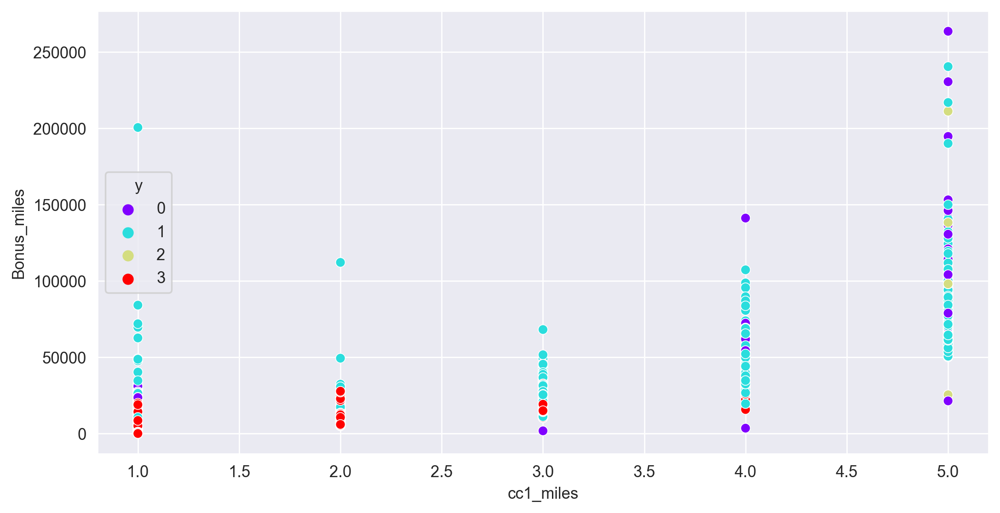

In [71]:
sns.scatterplot(df['cc1_miles'],df['Bonus_miles'],hue=data['y'],palette='rainbow')

# K-Means

In [48]:
df1 = pd.read_csv("EastWestAirlines.csv")

In [50]:
df1

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [54]:
x =df1.iloc[:,:-1]
y= df1['Award']

In [55]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

In [56]:
from sklearn.preprocessing import StandardScaler

In [57]:
sc = StandardScaler()
x =sc.fit_transform(x)

<AxesSubplot:xlabel='cc1_miles', ylabel='Bonus_miles'>

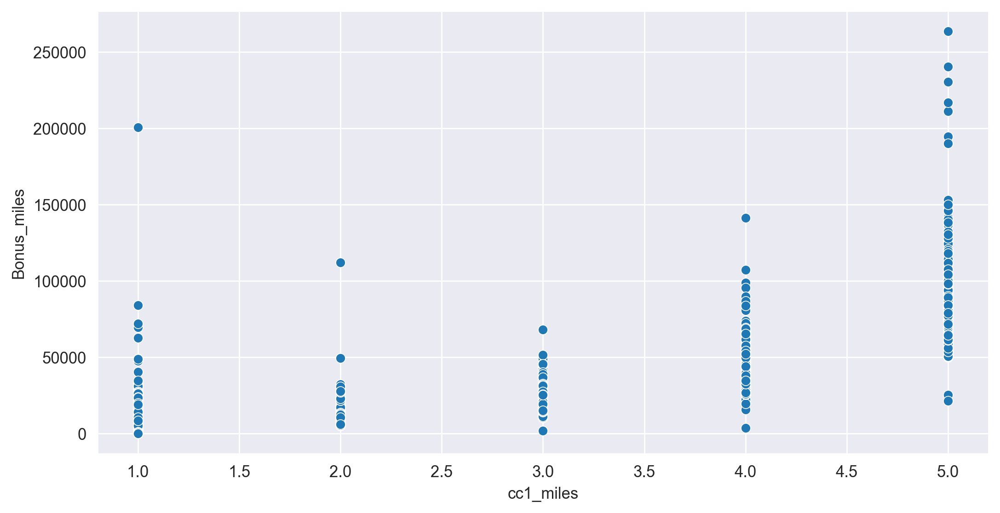

In [59]:
sns.scatterplot(df1['cc1_miles'],df1['Bonus_miles'])

# model building

In [60]:
from sklearn.cluster import KMeans

In [61]:
km = KMeans()
y1= km.fit_predict(x)


In [63]:
y1

array([0, 0, 0, ..., 7, 2, 2])

In [64]:
km.cluster_centers_

array([[-8.55209085e-01, -1.66697201e-01, -1.10871160e-01,
        -4.95941342e-01, -9.82418871e-02, -5.85985396e-02,
        -4.58443857e-01, -3.74163931e-01, -1.46233527e-01,
        -1.57929757e-01,  8.32204773e-01],
       [-9.17647306e-01,  9.53118463e-01, -8.57348695e-02,
         1.58587019e+00, -9.82418871e-02, -6.27665798e-02,
         1.53874995e+00,  8.92788522e-01,  8.98290906e-03,
         2.48540067e-02,  9.23188934e-01],
       [ 9.52861680e-01, -3.89334181e-01, -1.30979964e-01,
        -7.27403257e-01, -9.82418871e-02, -6.27665798e-02,
        -5.79629872e-01, -6.50222835e-01, -1.79976117e-01,
        -1.92486981e-01, -9.48561322e-01],
       [-1.86433908e-01,  1.10183545e+00,  4.78823927e-01,
         6.75705005e-02, -9.82418871e-02, -6.27665798e-02,
         6.58285623e-01,  1.78533369e+00,  4.14801292e+00,
         4.37932494e+00,  2.17175531e-01],
       [-3.01522483e-01,  6.39719256e-01, -8.44329231e-02,
         1.02208440e+00, -9.82418871e-02,  1.56462993e+01,
  

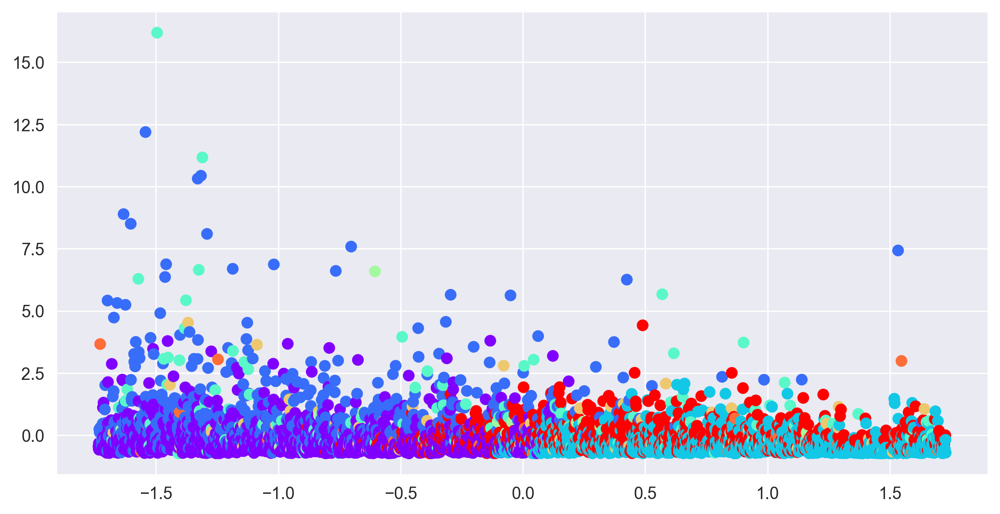

In [65]:
plt.scatter(x[:,0],x[:,1],c = y1, cmap='rainbow')

In [66]:
from sklearn.metrics import silhouette_score

In [67]:
silhouette_score(x,y1)

0.29534905336826706

# Elbow graph

In [69]:
wcss=[]


for i in range(1,20):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [70]:
wcss

[43989.0,
 35679.113760999484,
 31171.544591315946,
 27240.383351211836,
 23537.299843857527,
 20127.622743693813,
 17548.281187300698,
 15970.609313945186,
 14693.335417584829,
 13647.062466545827,
 12819.358689612727,
 12219.06720393895,
 11727.446179698627,
 11250.061205797021,
 10830.753851723246,
 10391.924546798768,
 10093.084044453843,
 9806.713690961215,
 9496.584343367407]

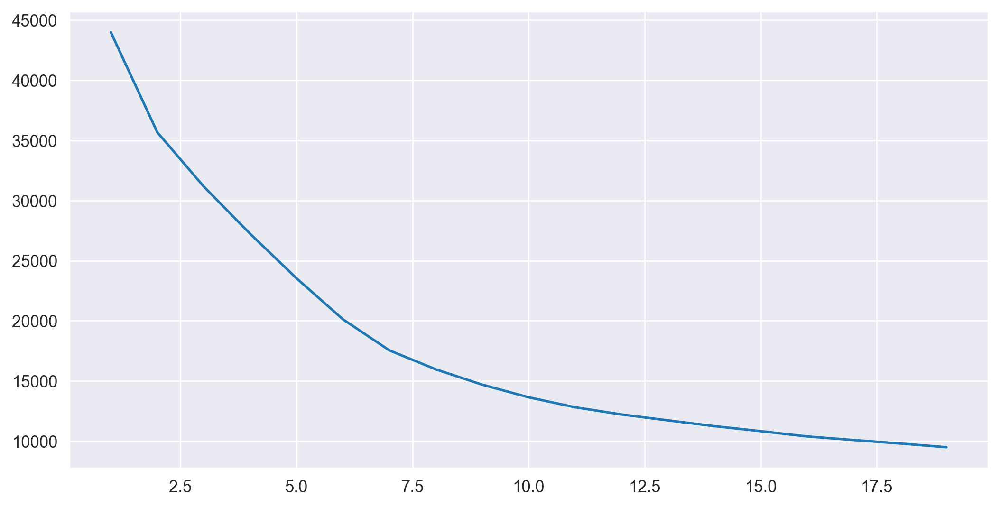

In [71]:
plt.plot(range(1,20),wcss)

In [78]:
km = KMeans(n_clusters=10)
ypred = km.fit_predict(x)

In [79]:
ypred

array([0, 0, 0, ..., 1, 8, 8])

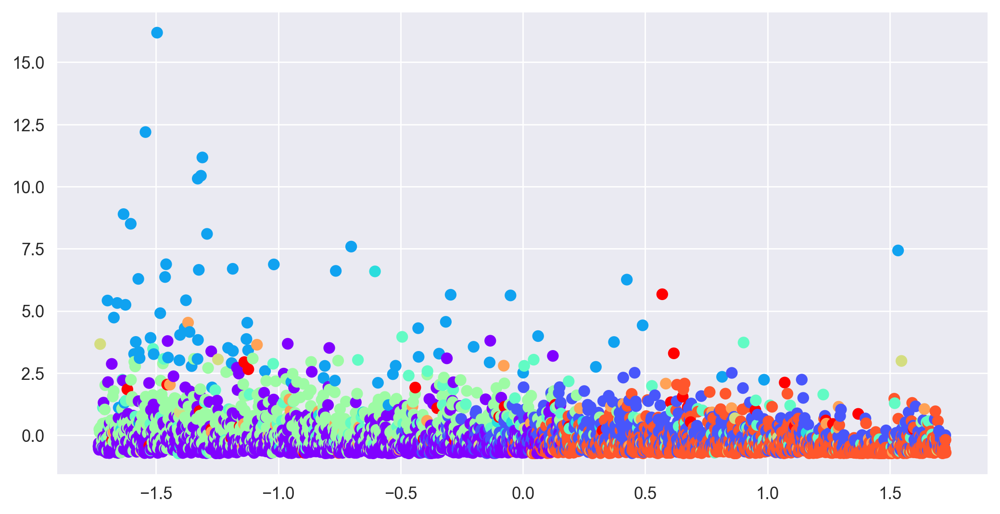

In [80]:
plt.scatter(x[:,0],x[:,1],c=ypred,cmap='rainbow')

In [81]:
km.cluster_centers_

array([[-7.98574795e-01, -2.17707974e-01, -1.15739584e-01,
        -6.32357011e-01, -9.82418871e-02, -5.81139718e-02,
        -5.31881212e-01, -5.14041738e-01, -1.98099105e-01,
        -2.09860289e-01,  7.75118223e-01],
       [ 5.99247304e-01, -5.91534088e-03, -1.25074688e-01,
         8.17864315e-01, -9.82418871e-02, -4.79186915e-02,
         3.73492419e-01,  6.62212610e-01, -2.03513137e-01,
        -2.25750130e-01, -5.81524797e-01],
       [-9.41212142e-01,  4.65963903e+00,  1.41870805e-01,
         1.50026468e+00, -9.82418871e-02, -6.27665798e-02,
         2.64722233e+00,  1.30847414e+00,  6.97453106e-01,
         9.78126869e-01,  1.02912220e+00],
       [-3.01522483e-01,  6.39719256e-01, -8.44329231e-02,
         1.02208440e+00, -9.82418871e-02,  1.56462993e+01,
         3.17969131e+00,  1.71461374e+00,  3.32926913e-02,
         5.96953922e-02,  2.39872612e-01],
       [-2.82723794e-02,  3.49399326e-01,  1.12913997e-01,
        -2.17204616e-01, -9.82418871e-02, -6.27665798e-02,
  

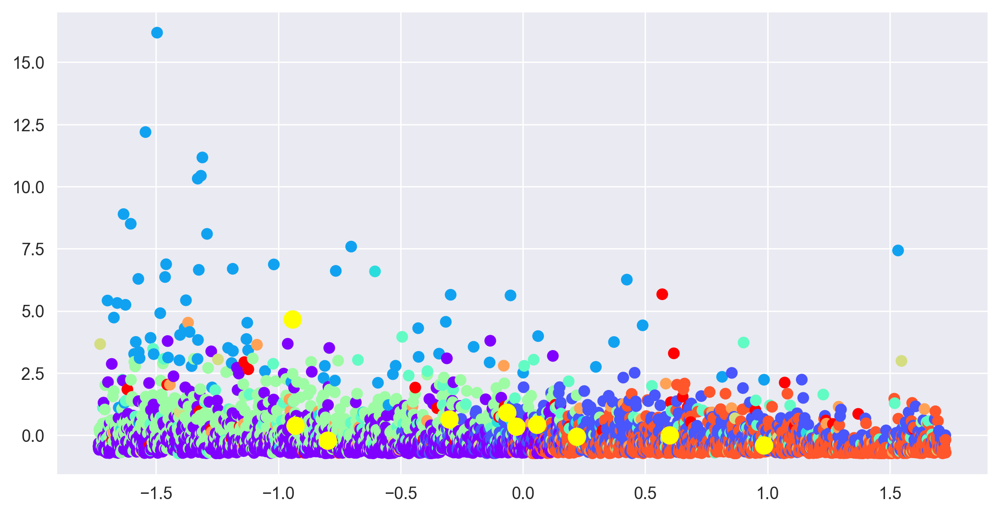

In [82]:
plt.scatter(x[:,0],x[:,1],c=ypred,cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='yellow',s=100)

In [83]:
silhouette_score(x,ypred)

0.30528495136337547

# DBSCAN

In [3]:
df2 = pd.read_csv("EastWestAirlines.csv",index_col=1)

In [4]:
df2

,ID,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
Balance,,,,,,,,,,,
28143,1,0,1,1,1,174,1,0,0,7000,0
19244,2,0,1,1,1,215,2,0,0,6968,0
41354,3,0,1,1,1,4123,4,0,0,7034,0
14776,4,0,1,1,1,500,1,0,0,6952,0
97752,5,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
18476,4017,0,1,1,1,8525,4,200,1,1403,1
64385,4018,0,1,1,1,981,5,0,0,1395,1
73597,4019,0,3,1,1,25447,8,0,0,1402,1


In [5]:
df2.describe()

,ID,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
count,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

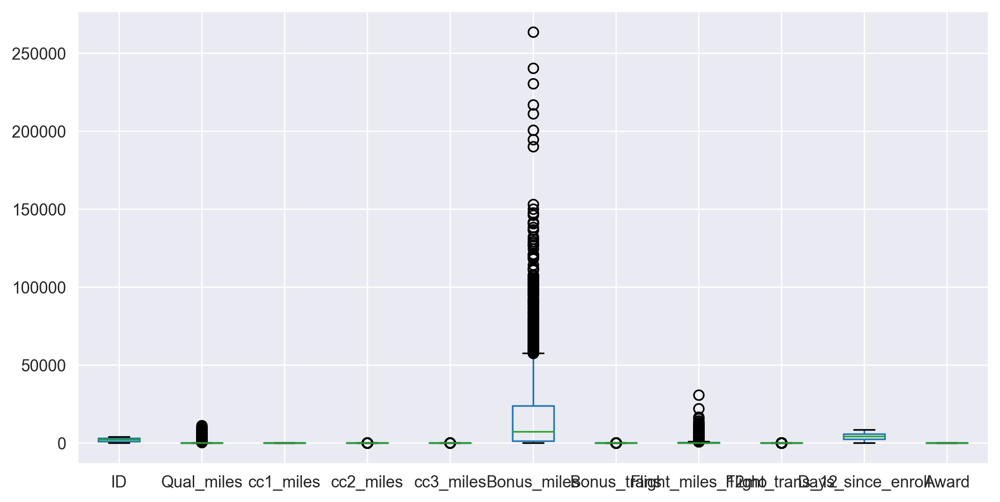

In [85]:
df2.boxplot()


In [17]:
sns.pairplot(df)

In [11]:
from sklearn.preprocessing import StandardScaler

# feature Scaling

In [76]:
sc = StandardScaler()
x = sc.fit_transform(df2)

In [77]:
x

array([[-1.73512503, -0.18629869, -0.76957841, ..., -0.36216787,
         1.39545434, -0.7669193 ],
       [-1.73426342, -0.18629869, -0.76957841, ..., -0.36216787,
         1.37995704, -0.7669193 ],
       [-1.73340181, -0.18629869, -0.76957841, ..., -0.36216787,
         1.41192021, -0.7669193 ],
       ...,
       [ 1.72682006, -0.18629869,  0.68312117, ..., -0.36216787,
        -1.31560393,  1.30391816],
       [ 1.72768167, -0.18629869, -0.76957841, ..., -0.09850333,
        -1.31608822, -0.7669193 ],
       [ 1.72854328, -0.18629869, -0.76957841, ..., -0.36216787,
        -1.31754109, -0.7669193 ]])

# model building

In [19]:
from sklearn.cluster import DBSCAN

In [24]:
db = DBSCAN()
y = db.fit_predict(x)


In [25]:
pd.DataFrame(y)

,0
0,0
1,0
2,0
3,0
4,-1
...,...
3994,1
3995,1
3996,-1
3997,0


In [29]:
from sklearn.metrics import silhouette_score

In [30]:
silhouette_score(x,y)

-0.10314733991997024

# Hyperparameter tuning

In [32]:
from  sklearn.neighbors import NearestNeighbors

In [35]:
neigh = NearestNeighbors(n_neighbors=3).fit(x)
d,i =neigh.kneighbors(x)

In [36]:
d

array([[0.        , 0.02700571, 0.07799591],
       [0.        , 0.08952028, 0.10510519],
       [0.        , 0.19646658, 0.21887916],
       ...,
       [0.        , 0.16550881, 0.28953453],
       [0.        , 0.17606962, 0.32036289],
       [0.        , 0.01900344, 0.02347895]])

In [37]:
pd.DataFrame(d)

,0,1,2
0,0.0,0.027006,0.077996
1,0.0,0.089520,0.105105
2,0.0,0.196467,0.218879
3,0.0,0.027006,0.058261
4,0.0,0.521348,0.743411
...,...,...,...
3994,0.0,0.331626,0.368547
3995,0.0,0.107711,0.271525
3996,0.0,0.165509,0.289535
3997,0.0,0.176070,0.320363


# Dist plot

In [40]:
dist = np.sort(d[:,1],axis=0)
dist

array([8.61609032e-04, 8.61609032e-04, 8.61609032e-04, ...,
       5.12393965e+00, 6.15624891e+00, 7.50902174e+00])

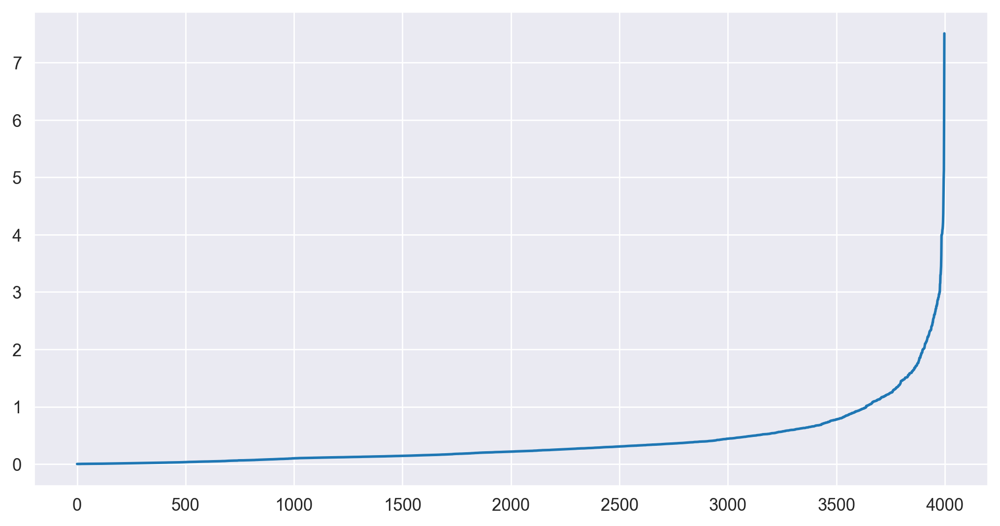

In [41]:
plt.plot(dist)

In [80]:
db = DBSCAN(eps=1,min_samples=3)
ypred = db.fit_predict(x)
ypred

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [58]:
silhouette_score(x,ypred)

0.06872409579172811

In [81]:
df['cluster2']=ypred

In [60]:
df[df['cluster2']==-1]

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,cluster,cluster2
8,9,443003,0,3,2,1,1753,43,3850,12,6948,1,-1,-1
21,22,185681,2024,1,1,1,13300,16,1800,9,6896,1,-1,-1
22,23,20584,0,1,1,1,3450,11,3450,11,6884,0,-1,-1
42,43,60313,0,1,1,1,10000,26,3250,9,7829,1,-1,-1
45,46,288865,967,1,1,1,23600,14,2000,4,6884,1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3902,3925,13004,1000,1,1,1,13890,39,0,0,1572,1,-1,-1
3911,3934,55922,2273,1,1,1,8104,19,4104,16,1552,0,-1,-1
3917,3940,130748,0,4,1,1,65510,37,6349,7,1545,0,-1,-1
3934,3957,76595,0,1,1,1,10577,2,9577,1,1515,0,-1,-1


In [62]:
sns.pairplot(df,hue='cluster2',palette='rainbow')

<AxesSubplot:xlabel='cc2_miles', ylabel='Bonus_trans'>

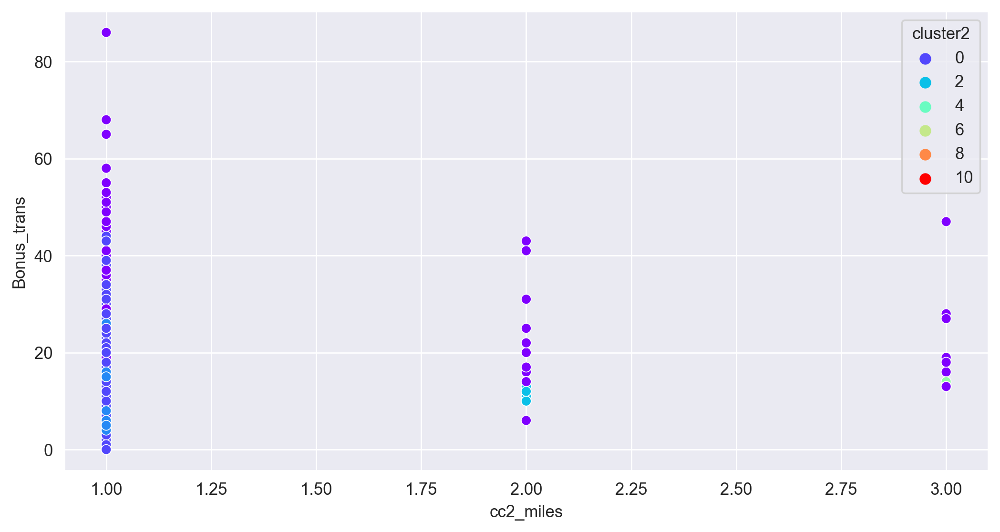

In [72]:
sns.scatterplot(df['cc2_miles'],df['Bonus_trans'],hue=df['cluster2'],palette='rainbow')

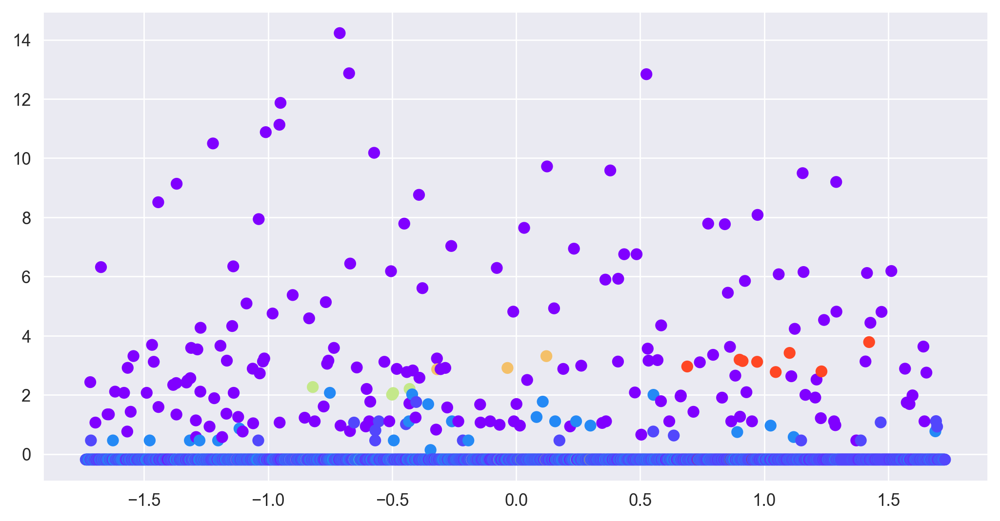

In [84]:
plt.scatter(x[:,0],x[:,1],c=ypred,cmap='rainbow')